In [ ]:
!pip install vk_api

In [ ]:
import vk_api
import pandas as pd
import numpy as np
import csv
import scipy
import requests
import networkx as nx
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.figure_factory as ff
from scipy.linalg import fractional_matrix_power
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import squareform
from scipy.sparse import csr_matrix
from scipy.cluster.hierarchy import dendrogram, linkage
from typing import Dict, List
from tqdm.notebook import trange, tqdm
from IPython.core.display import display, HTML
from scipy.stats import kstest
from sklearn.linear_model import LinearRegression
from networkx.algorithms.community import modularity
from sklearn.metrics import silhouette_score

# Network summary

- Network source and the description of preprocessing steps.
- Type of the graph: directed/undirected, heterogeneous/homogeneous, weighted/unweighted, etc.
- Node/Edge attributes.
- Number of nodes and edges.
- Diameter, radius.
- Clustering coefficient (global, average local, histogram).
- Average path length (histogram).
- Degree distribution, fitted models by regression/MLE/KS-test.
- Gorgeous network layout. Try to show that your network has some structure, play with node sizes and colors, scaling parameters. Tools like Gephi may be useful here.

* <h1>Network source and the description of preprocessing steps.</h1>

<h1>Данные скачиваются из ВК с помощью VK Api. В проекте в качестве сети рассматривается страница Евгения Баженова (BadComedian - BC) и данные о пользователях в списке его друзей.</h1>

In [ ]:
def auth_handler():
    """ 
    При двухфакторной аутентификации вызывается эта функция.
    """
    # Код двухфакторной аутентификации
    key = input("Enter authentication code: ")
    # Если: True - сохранить, False - не сохранять.
    remember_device = True
    return key, remember_device

In [ ]:
# старт сессии ВК
login = ''
password = ''
vk_session = vk_api.VkApi(
  login, password,
  auth_handler=auth_handler
)

vk_session.auth()
vk = vk_session.get_api()

In [ ]:
# загрузка данных о друзьях BC
badcomedian_id = 3664185
friend_ids = vk.friends.get(user_id=badcomedian_id)['items']

In [ ]:
# запись данных в граф с учетом возможной ошибки 
# из-за закрытых профилей
graph = {}
private = []
for friend_id in tqdm(friend_ids):
    try:
      vk.friends.get(user_id=friend_id)
    except vk_api.ApiError:
      private.append(friend_id)
    else:
      graph[friend_id] = vk.friends.get(user_id = friend_id)["items"]

  0%|          | 0/739 [00:00<?, ?it/s]

In [ ]:
# Запись данных в граф.
# Ребро - "дружба" пользователей.
# По требованию задания, 
# пользователь BC в графе 
# отсутсвует.
G = nx.Graph()
for i in list(graph.keys()):
    if i != badcomedian_id:
      G.add_node(i)
    for j in graph[i]:
        if (j != badcomedian_id) & (i != j) & (i in friend_ids) & (j in friend_ids):
          G.add_edge(i, j)

In [ ]:
badcomedian_id in list(G.nodes)

False

* <h1>Type of the graph: directed/undirected, heterogeneous/homogeneous, weighted/unweighted, etc.</h1>

<h1>Граф неориентированный, рассматриваются только друзья, а в ВК стать другом можно только взаимно. Граф невзвешенный.</h1>

* <h1>Node/edge attributes</h1>

<h1>Аттрибуты графа:</h1>



*   Имя
*   Пол
*   Город
*   Дата рождения
*   Образование
*   Количество общих друзей с пользователем BC
*   Количество друзей у пользователя
*   Количество общих друзей у пользователей (атрибут граней)



In [ ]:
# считывание данных черех Api
friend_ids_str = ', '.join(
    [str(friend_id) for friend_id in G.nodes]
    )
info = vk.users.get(
    user_ids=[str(friend_id) for friend_id in G.nodes], 
    fields='first_name, last_name, sex, city, bdate, education'
    )

In [ ]:
# Запись атрибутов вершин.
node_attributes = {}
sex_dict = {
    1: "female", 
    2: "male", 
    3: "unknown"
    }
for node in info:
    if 'bdate' in node.keys():
        bdate = node['bdate']
    else:
        bdate = 'Нет данных'
        
    if 'city' in node.keys():
        city = node['city']['title']
    else:
        city = 'Нет данных'
    if 'university_name' in node.keys() and len(node['university_name']) > 0:
        university = node['university_name']
    else:
        university = 'Нет данных'
    try:
      graph[node['id']]
    except KeyError:
      number_of_friends = 0
    else:
      number_of_friends = len(graph[node['id']])
    node_attributes[node['id']] = {'name': node['first_name']+' '+node['last_name'],
                                   'sex': sex_dict[node['sex']],
                                   'city': city,
                                   'birthdate': bdate,
                                   'education': university,
                                   'number_of_common_friends_with_user': len(G.adj[int(node['id'])]),
                                   'number_of_friends': number_of_friends
                                  }
nx.set_node_attributes(G, node_attributes)

In [ ]:
# Запись атрибутов граней.
edge_attributes = {}
for i in range(len(info)):
  for j in range(i+1, len(info)):
    edge_attributes[
                    (info[i]['id'], info[j]['id'])
                    ] = len(
                        set(G.adj[int(info[i]['id'])].keys()) & 
                        set(G.adj[int(info[j]['id'])].keys())
                        )
nx.set_edge_attributes(G, edge_attributes, "number_of_common_friends")

In [ ]:
nx.write_gexf(G, "network.gexf")

In [ ]:
G = nx.read_gexf('network.gexf')

* <h1>Number of nodes and edges.</h1>

In [ ]:
n_edges = G.number_of_edges()
n_nodes = G.number_of_nodes()
display(HTML('<h1>Количество ребер: %a</h1>'%n_edges))
display(HTML('<h1>Количество вершин: %a</h1>'%n_nodes))

* <h1>Diameter, radius.</h1>

In [ ]:
def select_gygantic_component(g: nx.Graph) -> nx.Graph:
  nodes_gcc = sorted(nx.connected_components(g), key=len, reverse=True)[0]
  return g.subgraph(nodes_gcc).copy()

In [ ]:
largest_connected_component = select_gygantic_component(G)
diameter = nx.diameter(largest_connected_component)
radius = nx.radius(largest_connected_component)
display(HTML('<h1>Радиус: %a</h1>'%radius))
display(HTML('<h1>Диаметр: %a</h1>'%diameter))

* <h1>Clustering coefficient (global, average local, histogram).</h1>

In [ ]:
average_local_cc = nx.average_clustering(G)
local_cc = nx.clustering(G)
global_cc = nx.algorithms.cluster.transitivity(G)
display(HTML('<h1>Average local coefficient: %a</h1>'%np.round(np.mean(list(local_cc.values())), 3)))
display(HTML('<h1>Global clustering coefficient: %a</h1>'%np.round(global_cc, 3)))

* <h1>Average path length (histogram).</h1>

In [ ]:
apl = nx.average_shortest_path_length(largest_connected_component)
display(HTML('<h1>Средняя длина пути: %a</h1>'%np.round(apl, 4)))

In [ ]:
paths = dict(nx.shortest_path_length(G))

In [ ]:
end = list(paths.keys())[0]
len_of_path = []
for key in list(paths.keys()):
  len_of_path += list(paths[key].values())

* <h1>Degree distribution, fitted models by regression/MLE/KS-test.</h1>

<h1>У степеней вершин показательный закон распределения, так как граф демонстрирует взаимодействие людей в реальном мире.</h1>

In [ ]:
# Функции для подбора модели
# линейной регрессии распределения 
# степеней вершин.

def power_law_cdf(k, alpha=3.5, k_min=1):
    return 1 - k**(1-alpha) / k_min**(1-alpha)


def power_law_pdf(x, alpha=3.5, x_min=1):
    C = (alpha - 1) / x_min ** (1 - alpha)
    return C * x ** (-alpha)


def mle_power_law_params(degree_sequence):
    best_kst, best_alpha, best_xmin = np.inf, 0, 0
    for x_min in sorted(degree_sequence)[:-1]:
      summands = np.log(degree_sequence[degree_sequence > x_min] / x_min)
      if sorted(degree_sequence)[0] == sorted(degree_sequence)[1]:
        n = degree_sequence[degree_sequence >= x_min].size
      else:
        n = degree_sequence.size
      if sum(summands):
        alpha = 1 + n / sum(summands)
      else:
        alpha = 1
      d = kstest(degree_sequence[degree_sequence >= x_min], cdf=power_law_cdf, args=[alpha, x_min])[0]
      if d < best_kst:
        best_xmin = x_min
        best_alpha = alpha
        best_kst = d
    return best_alpha, best_xmin


def alpha_lin_bins(x_train, bins):
    hist, bin_edges = np.histogram(x_train, bins=bins, density=True)
    bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
    idx = np.argwhere(hist > 0)
    x1 = np.log(bin_centers[idx])[:, 0]
    x2 = np.ones(len(idx))
    X = np.stack([x1, x2], axis=1)
    y = np.log(hist[idx])
    coef, intercept = (np.linalg.pinv(X) @ y)[:, 0]
    return -coef


def alpha_log_bins(x_train, bins):
    binning = np.logspace(np.log10(x_train.min()), np.log10(x_train.max()), bins)
    hist, bin_edges = np.histogram(x_train, bins=binning, density=True)
    bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
    idx = np.argwhere(hist > 0)
    x1 = np.log(bin_centers[idx])[:, 0]
    x2 = np.ones(len(idx))
    X = np.stack([x1, x2], axis=1)
    y = np.log(hist[idx])
    coef, intercept = (np.linalg.pinv(X) @ y)[:, 0]
    return -coef


def regression_fit(x_train, bins):
    bins = np.logspace(np.log10(1), np.log10(x_train.max()), bins)
    histogram = np.histogram(x_train, bins = bins, density=True)
    density = np.log(histogram[0][np.where(histogram[0] != 0)])
    bin_centres = np.log((bins[1:] + bins[:-1]) / 2)
    bin_centres = bin_centres[np.where(histogram[0] != 0)]
    bin_centres = bin_centres.reshape(-1, 1)
    regression = LinearRegression()
    regression.fit(bin_centres, density)
    return abs(regression.coef_[-1])

In [ ]:
degrees = list(dict(G.degree()).values())
degrees_dist = pd.value_counts(degrees)
degrees_dist.sort_index(inplace = True)
pdf = degrees_dist / len(degrees)
alpha_reg = regression_fit(np.array(degrees), 100)

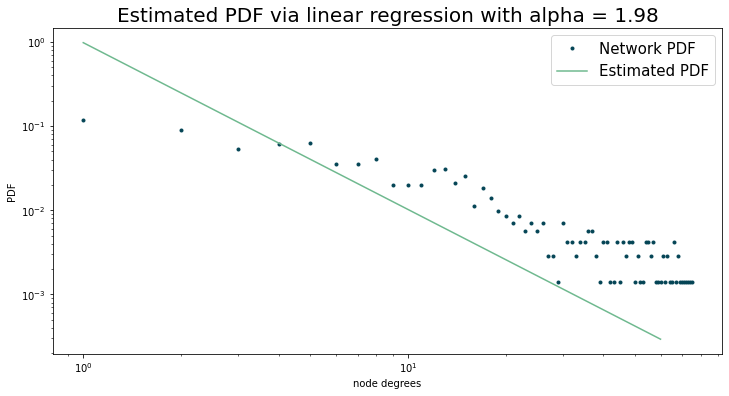

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.arange(0, len(pdf)), pdf,'.', color= '#044455',label='Network PDF')
x_space = np.linspace(1, 60, 100)
plt.plot(x_space, power_law_pdf(x_space, alpha_reg, 1), color= '#6FB98F', label='Estimated PDF')
plt.legend(fontsize = 15)
plt.title('Estimated PDF via linear regression with alpha = {}'.format(round(alpha_reg,2)), fontsize = 20)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('node degrees')
plt.ylabel('PDF')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: RuntimeWarning: divide by zero encountered in true_divide


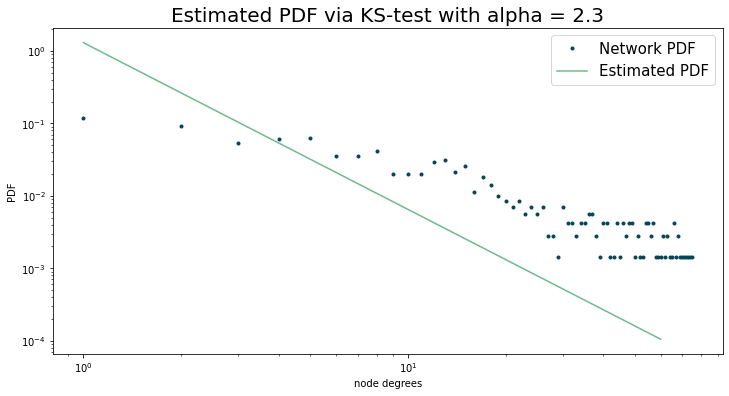

In [ ]:
alpha_reg, x_min = mle_power_law_params(np.array(degrees))
plt.figure(figsize=(12,6))
plt.plot(np.arange(0, len(pdf)), pdf,'.', color= '#044455',label='Network PDF')
x_space = np.linspace(1, 60, 100)
plt.plot(x_space, power_law_pdf(x_space, alpha_reg, 1), color= '#6FB98F', label='Estimated PDF')
plt.legend(fontsize = 15)
plt.title('Estimated PDF via KS-test with alpha = {}'.format(round(alpha_reg,2)), fontsize = 20)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('node degrees')
plt.ylabel('PDF')
plt.show()

* <h1>Gorgeous network layout.</h1>

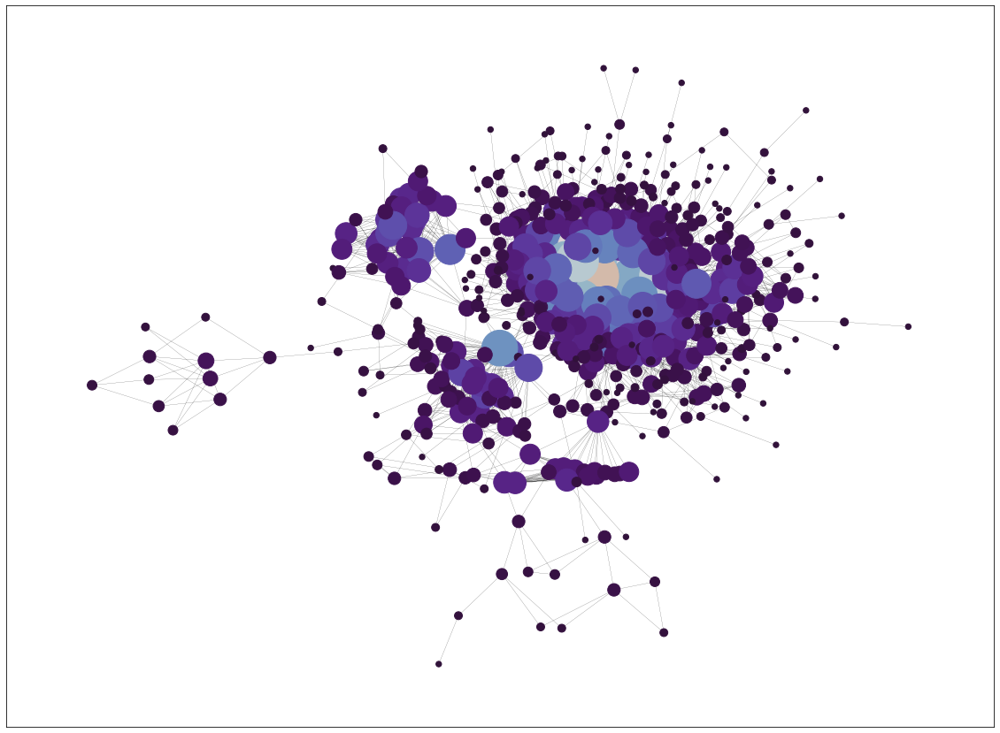

In [ ]:
plt.figure(figsize=(20,15))
nx.draw_networkx(
    G, 
    node_size=[G.degree[node] * 40 for node in G.nodes], 
    node_color=degrees, with_labels=False, 
    width = 0.15, 
    pos=nx.kamada_kawai_layout(G), 
    cmap = 'twilight_shifted'
    )

<h1>Визуализация с помощью Gephi</h1>

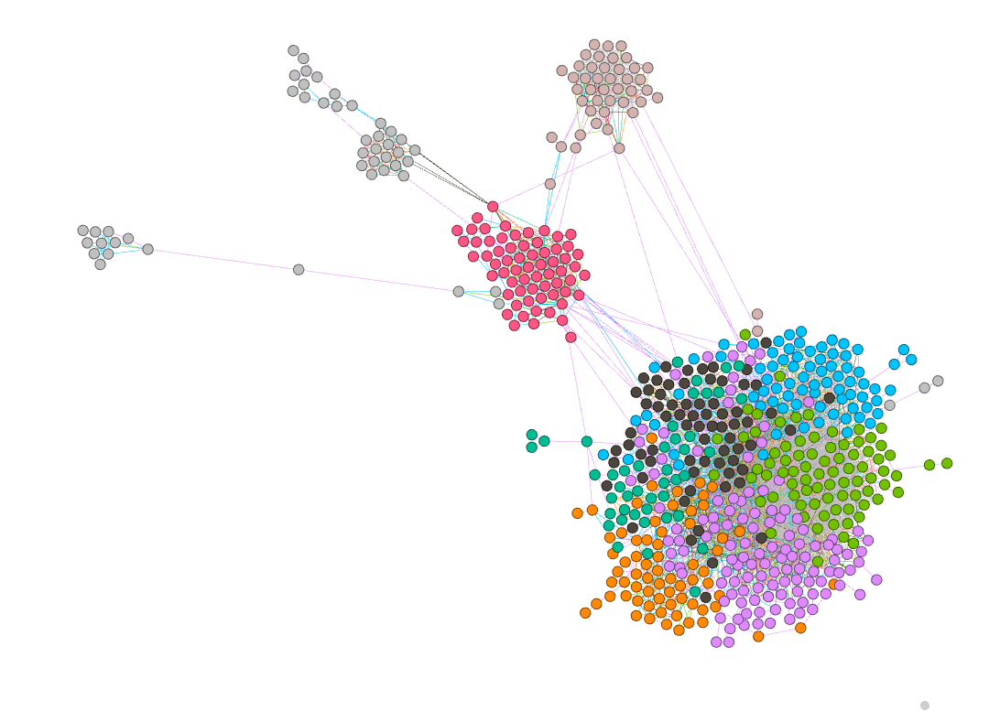

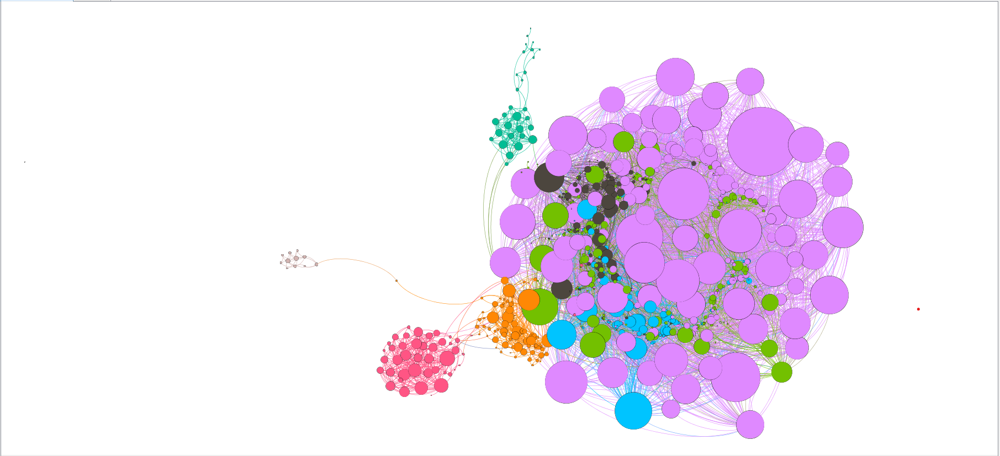

# Structural Analysis

- The closest random graph model similar to your social network. Compare models from lectures, such as ER, BA, WS. Check real-world network properties on chosen random graph models and your network, compare the results.
- Degree/Closeness/Betweenness/Katz/Eigenvector centralities, top nodes description.
- Page-Rank/HITS in a case of directed network, top nodes description.
- Correlation comparison of centralities.
- Assortative mixing by node attributes and node degree.
- Node structural equivalence/similarity.

* <h1>The closest random graph model similar to my social network</h1>

In [27]:
# Функции для генерации графов
# и построения графов.

def attach(node, G, m):
    degree_seq = np.array([degree for node, degree in G.degree])
    p = degree_seq / degree_seq.sum()
    targets = np.random.choice(G.nodes, size=m, replace=False, p=p)
    G.add_edges_from([(node, target) for target in targets])


def barabasi_albert_graph(n, m):
    G = nx.star_graph(m)
    for i in range(1, n - m):
      attach(m + i, G, m)
    return G


def random_edges(nodes, p):
    N = len(nodes)
    edges = []
    for i in range(N-1):
      for j in range(i+1, N):
        if np.random.rand() < p:
          edges.append([nodes[i], nodes[j]])
    return np.array(edges)


def erdos_renyi_graph(n, p):
    G = nx.Graph()
    nodes = np.arange(n)
    G.add_nodes_from(nodes)
    G.add_edges_from(random_edges(nodes, p))
    return G


def ring_lattice(n, k):
    edges = []
    for node_i in range(n):
      for degree in range(k // 2):
        edges.append([node_i, (node_i + degree + 1) % n])
    return nx.from_edgelist(edges)


def rewire(G, node, k, p, n):
    neighbors = []
    for degree in range(k // 2):
      neighbors.append((node + degree + 1) % n)
    neighbors = np.array(neighbors)
    mask = np.random.random(size=len(neighbors)) < p
    for neighbor in neighbors[mask]:
      target = np.random.randint(len(G))
      if (node, target) not in G.edges and node != target:
        G.remove_edge(node, neighbor)
        G.add_edge(node, target)


def watts_strogatz_graph(n, k, p):
    G = ring_lattice(n, k)
    for node in G.nodes:
        rewire(G, node, k, p, n)
    return G


def plot_random_comparison(graph, title):
  degree_hist = np.array(nx.degree_histogram(graph))
  idx = np.argwhere(degree_hist > 0)
  fig = go.Figure()
  fig.add_trace(go.Scatter(x=np.hstack(idx), y=np.hstack(degree_hist[idx]), name='Random Network', mode='markers'))
  degree_hist = np.array(nx.degree_histogram(largest_connected_component))
  idx = np.argwhere(degree_hist > 0)
  fig.add_trace(go.Scatter(x=np.hstack(idx), y=np.hstack(degree_hist[idx]), name='Real Network', mode='markers'))
  fig.update_xaxes(type='log', title='$k$')
  fig.update_yaxes(type='log', title='$p_k$')
  fig.update_layout(
      title=title,
      font_family='Times New Roman'
      )
  fig.show()

In [37]:
n_nodes = largest_connected_component.number_of_nodes()
m_edges = largest_connected_component.number_of_edges()
k = np.mean(nx.degree_histogram(largest_connected_component))
p = np.mean(degrees) / n_nodes

ba_graph = barabasi_albert_graph(n_nodes, m_edges)
er_graph = erdos_renyi_graph(n_nodes, p)
ws_graph = watts_strogatz_graph(n_nodes, int(k), p)

<h1>Check of real-world network properties on chosen random graph models and my network, comparison of results with my network.</h1>

In [29]:
def gaussian_kernel(r, r_, sigma=1):
  return np.exp(-((r-r_)**2)/(2 * (sigma**2)))

In [33]:
graphs = [ba_graph, er_graph, ws_graph, G]
number_nodes = [nx.number_of_nodes(graph) for graph in graphs] 
number_cc = [nx.number_connected_components(graph) for graph in graphs]
radius = [nx.radius(graph) for graph in graphs[:-1]] + [nx.radius(largest_connected_component)]
diameter = [nx.diameter(graph) for graph in graphs[:-1]] + [nx.diameter(largest_connected_component)]
average_clustering = [nx.average_clustering(graph) for graph in graphs]
average_path_length = [nx.average_shortest_path_length(graph) for graph in graphs[:-1]] + [nx.average_shortest_path_length(largest_connected_component)]
graph_names = [
               'Barabarabasi - Albert', 
               'Erdos - Renyi', 
               'Watts - Strogatz',
               'BadComedian network'
               ] 

In [34]:
pd.DataFrame({
    'Number Nodes': number_nodes,
    'Number of Connected Components': number_cc,
    'Radius': radius,
    'Diameter': diameter,
    'Average Clustering Coefficient': average_clustering,
    'Average Shortest Path Length': average_path_length
}, index=graph_names).T

,Barabarabasi - Albert,Erdos - Renyi,Watts - Strogatz,BadComedian network
Number Nodes,4534.000000,619.000000,619.000000,706.000000
Number of Connected Components,1.000000,1.000000,1.000000,74.000000
Radius,1.000000,4.000000,25.000000,7.000000
Diameter,2.000000,4.000000,42.000000,13.000000
Average Clustering Coefficient,0.000000,0.019311,0.466451,0.332085
Average Shortest Path Length,1.999559,2.794553,17.333401,3.735438


In [ ]:
gk_radius = [np.round(gaussian_kernel(radius[-1], el), 5) for el in radius[:-1]]
gk_diameter = [np.round(gaussian_kernel(diameter[-1], el), 5) for el in diameter[:-1]]
gk_average_clustering = [np.round(gaussian_kernel(average_clustering[-1], el), 5) for el in average_clustering[:-1]]
gk_average_path_length = [np.round(gaussian_kernel(average_path_length[-1], el), 5) for el in average_path_length[:-1]]
gk_number_cc = [np.round(gaussian_kernel(number_cc[-1], el), 5) for el in number_cc[:-1]]
display(HTML('<h1>Gaussian Kernel, метрика "схожести" </h1>'))
pd.DataFrame({
    'Number of Connected Components': gk_number_cc,
    'Radius': gk_radius,
    'Diameter': gk_diameter,
    'Average Clustering Coefficient': gk_average_clustering,
    'Average Shortest Path Length': gk_average_path_length
}, index=graph_names[:-1])

,Number of Connected Components,Radius,Diameter,Average Clustering Coefficient,Average Shortest Path Length
Barabarabasi - Albert,0.0,0.00000,0.0,0.94635,0.22165
Erdos - Renyi,0.0,0.01111,0.0,0.95286,0.63382
Watts - Strogatz,0.0,0.00000,0.0,0.99033,0.00000


<h1>По совокупности параметров, лучшей моделью является модель Erdos - Renyi.</h1>

<h1>Связано это с тем, что при росте степени вершины, функция случайного графа (на графике) ближе всего совпадает с функцией распределения исходного графа. Кроме того, при большом $n$ и малом $p$ распределение Бернулли можно аппроксимировать показательным законом распределения.</h1>

* <h1>Degree/Closeness/Betweenness/Katz/Eigenvector centralities, top nodes description.</h1>

In [61]:
def show_top_centralities(centrality, name, value=10, coeff=0.0007, size=(20, 20)):
  display(HTML('<h1>%a centrality</h1>'%name))
  ids = np.array(sorted(centrality.items(), key=lambda item: item[1], reverse = True))[:, 0]
  centrality_value = np.array(sorted(centrality.items(), key=lambda item: item[1], reverse = True))[:, 1]
  names = np.array([G.nodes[id]['name'] for id in ids])
  display(HTML(pd.DataFrame({'ID': ids, 'Name': names, name + ' Centrality': centrality_value}).head(value).to_html()))
  centrality_df = pd.DataFrame({'ID': ids, 'Name': names, 'Degree' + ' Centrality': centrality_value})
  layout = nx.kamada_kawai_layout(G)
  centrality_list = [dc[node] for node in G.nodes]
  centrality_df = centrality_df.head(3)
  ids = centrality_df["ID"].values
  names = list(centrality_df["Name"])
  labels = {ids[i]: names[i] for i in range(len(ids))}
  plt.figure(figsize=size)
  plt.title(name+" centrality", fontsize = 25)
  nx.draw_networkx(
      G, 
      node_size=200, 
      node_color=centrality_list, 
      labels=labels,
      width=0.1,
      font_size=30,
      pos=layout, 
      cmap = 'Spectral',
      font_color='black',
      with_labels=False
      )
  for key in labels.keys():
    layout[key][1] -= coeff * G.degree[key]
  nx.draw_networkx_labels(G, labels=labels, pos=layout, font_size=15, horizontalalignment='right')
  plt.show()

In [40]:
dc = nx.degree_centrality(G)
cc = nx.closeness_centrality(G)
bc = nx.betweenness_centrality(G)
kc = nx.katz_centrality_numpy(G)
ec = nx.eigenvector_centrality(G)

,ID,Name,Degree Centrality
0,10050301,Данила Поперечный,0.1914893617021277
1,190868,Руслан Усачев,0.14326241134751774
2,371559,Ярослав Андреев,0.13617021276595745
3,45882735,Стас Давыдов,0.13049645390070924
4,1823520,Юрий Дегтярёв,0.12056737588652483
5,263527069,Георгий Оганесян,0.11914893617021277
6,16232133,Ян Топлес,0.11773049645390071
7,60168,Юрий Иванов,0.11205673758865249
8,162384825,Ваня Федотов,0.11205673758865249
9,9361485,Владимир Элджин,0.10638297872340426


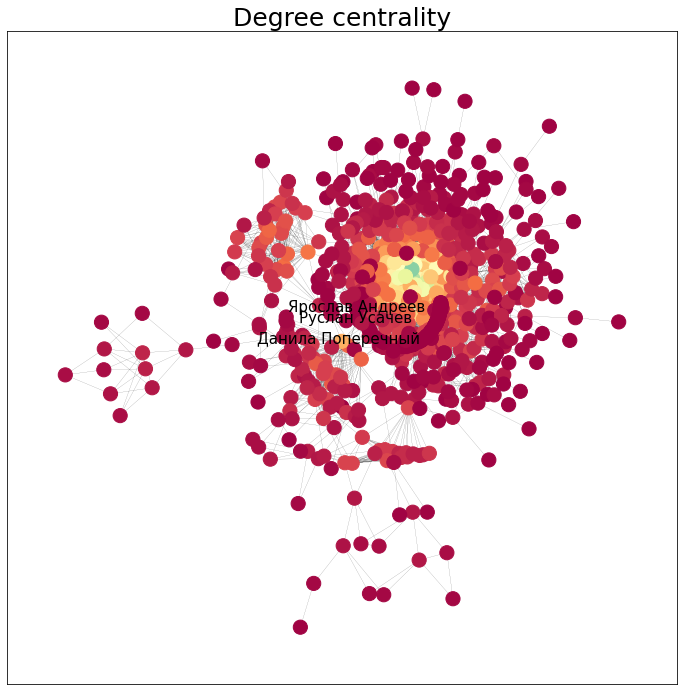

In [62]:
show_top_centralities(dc, 'Degree', size=(12, 12), coeff=0.0013)

<h1>По определению (из лекции): High centrality degree -direct contact with many other actors. Полученный топ соответствует данному определению, так как у </h1>

<h1>ДП: 619 друзей, </h1>

<h1>РУ: 555, </h1>

<h1>ЯА: 2327, </h1>

<h1>СД: 619</h1>

,ID,Name,Closeness Centrality
0,10050301,Данила Поперечный,0.3515484556864153
1,263527069,Георгий Оганесян,0.3441779988645273
2,5636046,Денис Колмыков,0.3430881381968119
3,190868,Руслан Усачев,0.3428709938055481
4,1823520,Юрий Дегтярёв,0.3409289932113065
5,45882735,Стас Давыдов,0.3394336906095025
6,82522148,Ann Margera,0.3364820932998546
7,371559,Ярослав Андреев,0.33606462172007817
8,142244404,Сергей Беляков,0.33440504334121357
9,60168,Юрий Иванов,0.33419874781786924


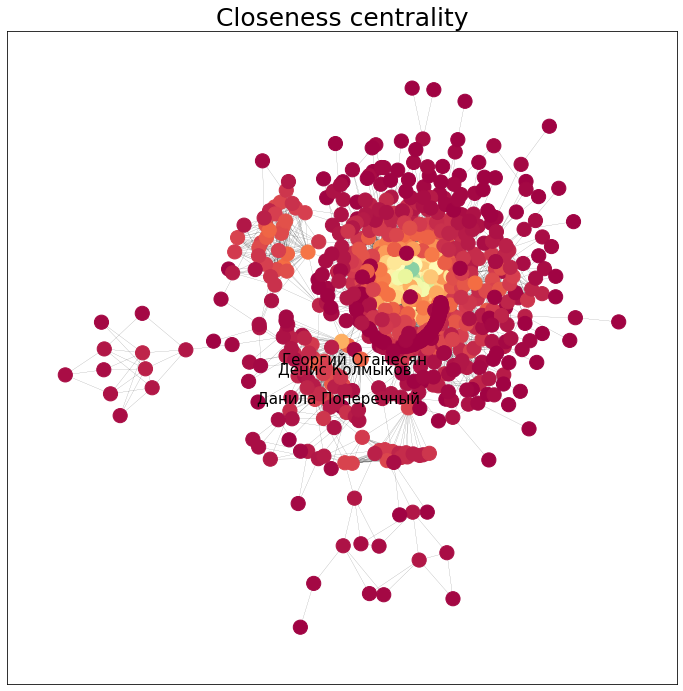

In [65]:
show_top_centralities(cc, 'Closeness', size=(12, 12), coeff=0.0025)

<h1>По определению из семинара: High closeness centrality - short communication path to others, minimal
number of steps to reach others. </h1>

<h1>ДП - всем известный персонаж, </h1>

<h1>ГО - случайный пользователь, который многих добавляет в друзья (8000 друзей), никаких сведений о нем найти не удалось</h1>

<h1>ДК - блогер по тематике кино с каналом на 500к подписчиков, 3000 друзей, 7000 подписчиков.</h1>

,ID,Name,Betwennes Centrality
0,1952722,Владимир Залужный,0.1030715647135868
1,1406271,Леи Радна,0.06213497650969293
2,82522148,Ann Margera,0.05405933218880459
3,5688147,Кирилл Потапов,0.04913678808062484
4,11651602,Ануар Тлегенов,0.04427210613546542
5,10050301,Данила Поперечный,0.043126214663228454
6,141572623,Стас Васильев,0.038852674263708746
7,3699541,Максим Сизинцев,0.037661544208506835
8,722157,Натали Косулина,0.03700023533614528
9,2560951,Даниил Масленников,0.036120880609469795


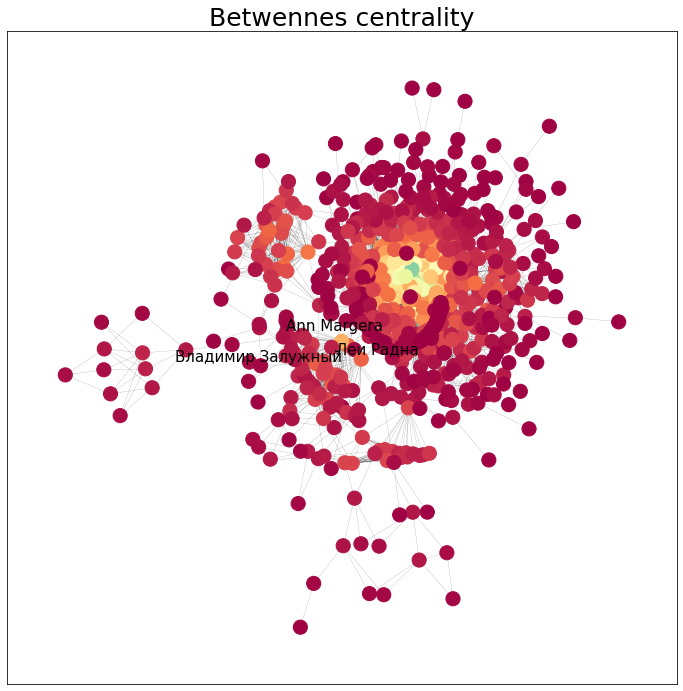

In [68]:
show_top_centralities(bc, 'Betwennes', size=(12,12), coeff=0.001)

<h1>По определению с лекции: High betweenness centrality - vertex lies on many shortest paths</h1>

<h1>ВЗ - друг BC, помогает организовывать съемки, знаком с людьми непосредственно стоящими перед камерой, но и техническим персоналом.</h1>

<h1>ЛР - модель.</h1>

<h1>AM - занимается организацией стендапов BC.</h1>

<h1>Интересно, что все люди связаны с технической частью блогосферы.</h1>

,ID,Name,Katz Centrality
0,1324639,Константин Сидорков,0.14114221959341097
1,3547343,Максим Кремнёв,0.11016108454061277
2,16759677,Евгений Лизунов,0.10797341989821292
3,30475904,Кирилл Калашников,0.10347209770699685
4,10319897,Максим Ковлагин,0.10117454997592
5,1300017,Никита Лихачёв,0.09113442867392904
6,4637725,Roman Zaripov,0.08839585246083327
7,1160624,Олимпия Ивлева,0.08819283100889759
8,90391715,Никита Маями,0.08346283111317156
9,463916950,Алексей Зуйков,0.0755752041167085


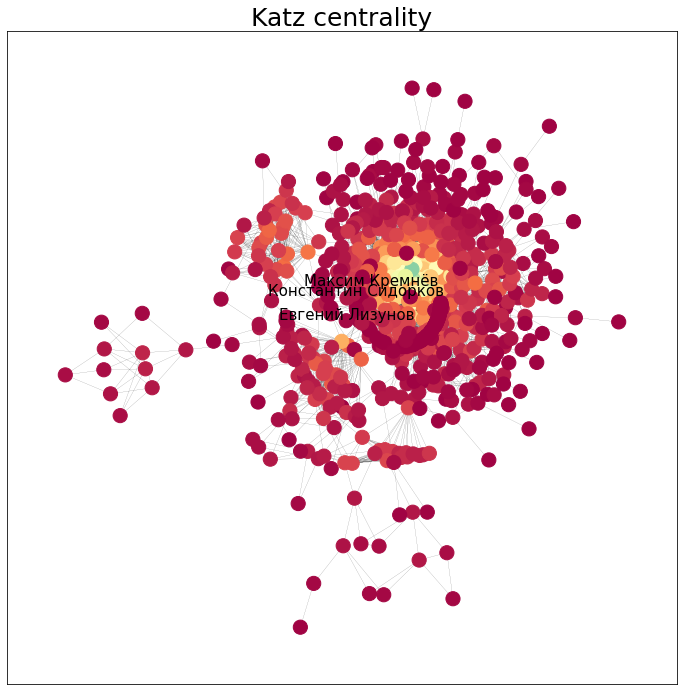

In [70]:
show_top_centralities(kc, 'Katz', size=(12,12), coeff=0.001)

<h1>The Katz centrality thesis is then:</h1>

<h1>A node is important if it is linked from other important nodes or if it is highly linked.</h1>

<h1>КС - Директор по развитию музыкальных проектов VK, много друзей, большие связи и т.п.</h1>

<h1>МК - ведущий Радио Energy и всего, что вообще можно вести. Не блогер, но друзей достаточно.</h1>

<h1>ЕЛ - видеооператор с большим количеством клиентов (6000 человек в группе ВК)</h1>





,ID,Name,Eigen Vector Centrality
0,10050301,Данила Поперечный,0.19397026039593349
1,190868,Руслан Усачев,0.17808290035472996
2,371559,Ярослав Андреев,0.16674579898263678
3,263527069,Георгий Оганесян,0.15522432043850776
4,45882735,Стас Давыдов,0.15310689932747334
5,16232133,Ян Топлес,0.15292740714243858
6,162384825,Ваня Федотов,0.15063161363620553
7,23379958,Эльдар Джарахов,0.15060735233826816
8,1823520,Юрий Дегтярёв,0.1466821456930269
9,9361485,Владимир Элджин,0.14590861634676522


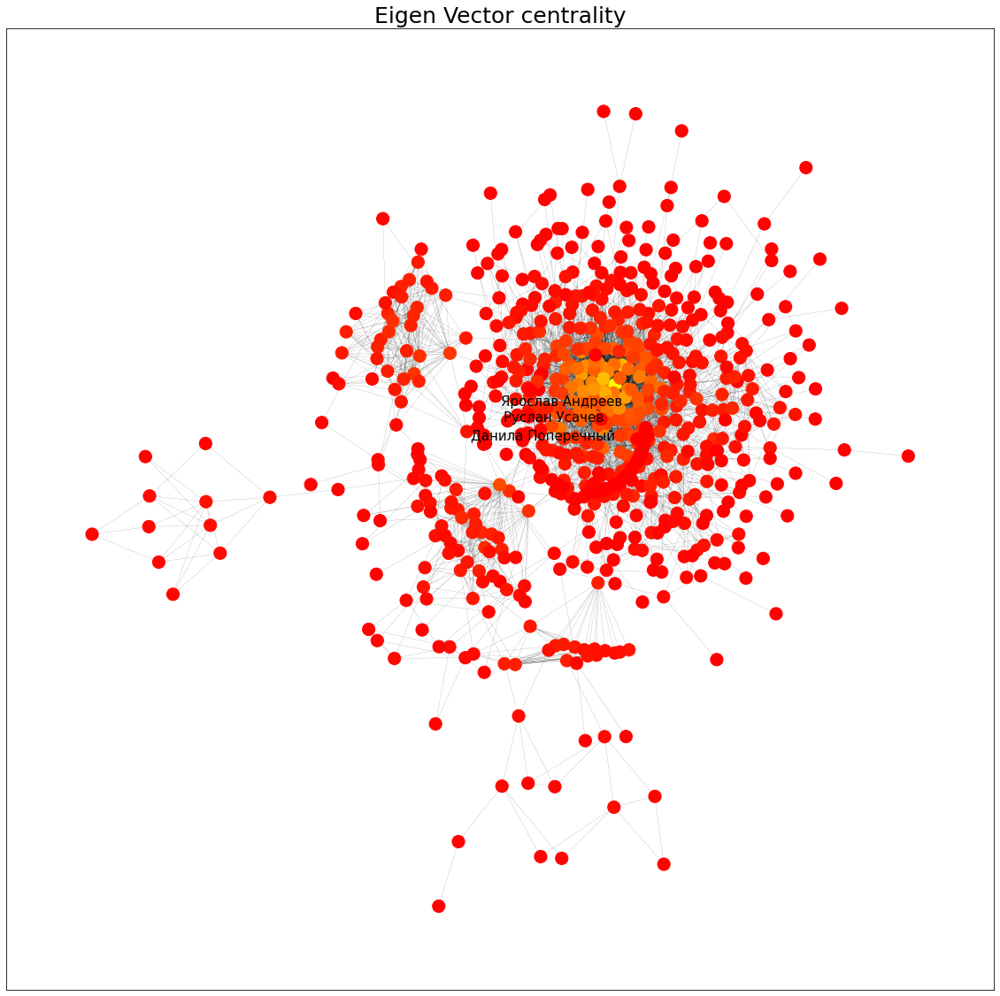

In [ ]:
show_top_centralities(ec, 'Eigen Vector')

<h1>A practical problem with eigenvector centrality is that it works well only if the graph is (strongly) connected. Real undirected networks typically have a large connected component, of size proportional to the network size.</h1>

<h1>Eigvec Centrality работает просто - "чем круче твои друзья, тем круче твоя центральность". Про "топ" указанных людей написано выше, все справедливо и здесь.</h1>

* <h1>Page-Rank/HITS in a case of directed network, top nodes description.</h1>

<h1><b>Примечание: граф неориентированный, Page-Rank и HITS тут не применимы.</b></h1>

In [ ]:
pagerank = nx.pagerank(G)
pagerank_sorted = dict(sorted(pagerank.items(), key=lambda item: item[1], reverse = True))
names = nx.get_node_attributes(G, "name")
names_list = [names[key] for key in list(pagerank_sorted.keys())]
data = [pagerank_sorted.keys(), names_list, pagerank_sorted.values()]
columns = ["ID", "Name", "Page-rank"]
pr_df = pd.DataFrame(data, index = columns).T.head(10)
pr_df.head(10)

,ID,Name,Page-rank
0,10050301,Данила Поперечный,0.010248
1,190868,Руслан Усачев,0.006999
2,371559,Ярослав Андреев,0.006982
3,1952722,Владимир Залужный,0.006786
4,45882735,Стас Давыдов,0.006708
5,1823520,Юрий Дегтярёв,0.006235
6,2677959,Максим Голополосов,0.005996
7,2325180,Кир Агашков,0.005947
8,16232133,Ян Топлес,0.005926
9,263527069,Георгий Оганесян,0.005909


[]

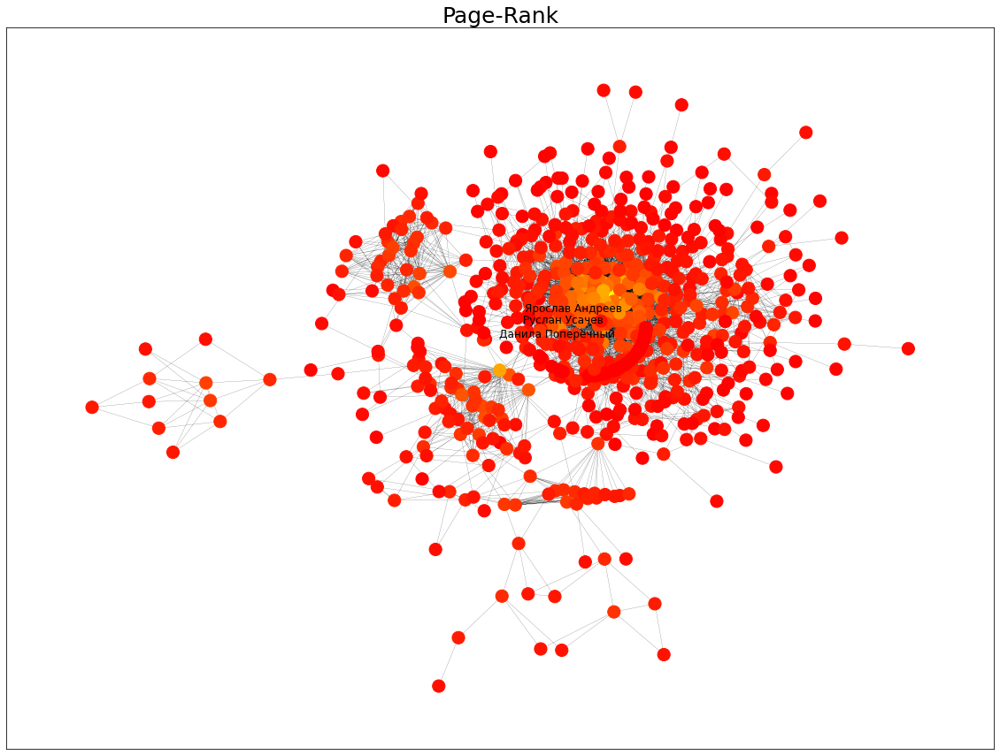

In [ ]:
plt.figure(figsize=(20,15))
layout = nx.kamada_kawai_layout(G)
pagerank_list = [pagerank[node] for node in G.nodes]
pr = pr_df.head(3)
ids = pr["ID"].values
names = pr["Name"].values
labels = {ids[i]: names[i] for i in range(len(ids))}
plt.title("Page-Rank", fontsize=25)
nx.draw_networkx(G, node_size=200, node_color=pagerank_list, width=0.15, pos=layout, cmap='autumn', with_labels=False)
for key in labels.keys():
  layout[key][1] -= 0.0007 * G.degree[key]
nx.draw_networkx_labels(G, labels=labels, pos=layout, horizontalalignment='right')
plt.plot()

<h1>Получилась линия $y=x$, что логично, так как граф неориентированный. </h1>

In [ ]:
hub, authority = nx.hits(G)
hub_sorted = dict(sorted(hub.items(), key=lambda item: item[1], reverse = True))
names = nx.get_node_attributes(G, "name")
names_list = [names[key] for key in list(hub_sorted.keys())]
data = [hub_sorted.keys(), names_list, hub_sorted.values()]
columns = ["ID", "Name", "HITS"]
hub_df = pd.DataFrame(data, index=columns).T.head(10)
hub_df.head(10)

,ID,Name,HITS
0,10050301,Данила Поперечный,0.016298
1,190868,Руслан Усачев,0.014963
2,371559,Ярослав Андреев,0.014011
3,263527069,Георгий Оганесян,0.013043
4,45882735,Стас Давыдов,0.012865
5,16232133,Ян Топлес,0.01285
6,162384825,Ваня Федотов,0.012657
7,23379958,Эльдар Джарахов,0.012655
8,1823520,Юрий Дегтярёв,0.012325
9,9361485,Владимир Элджин,0.01226


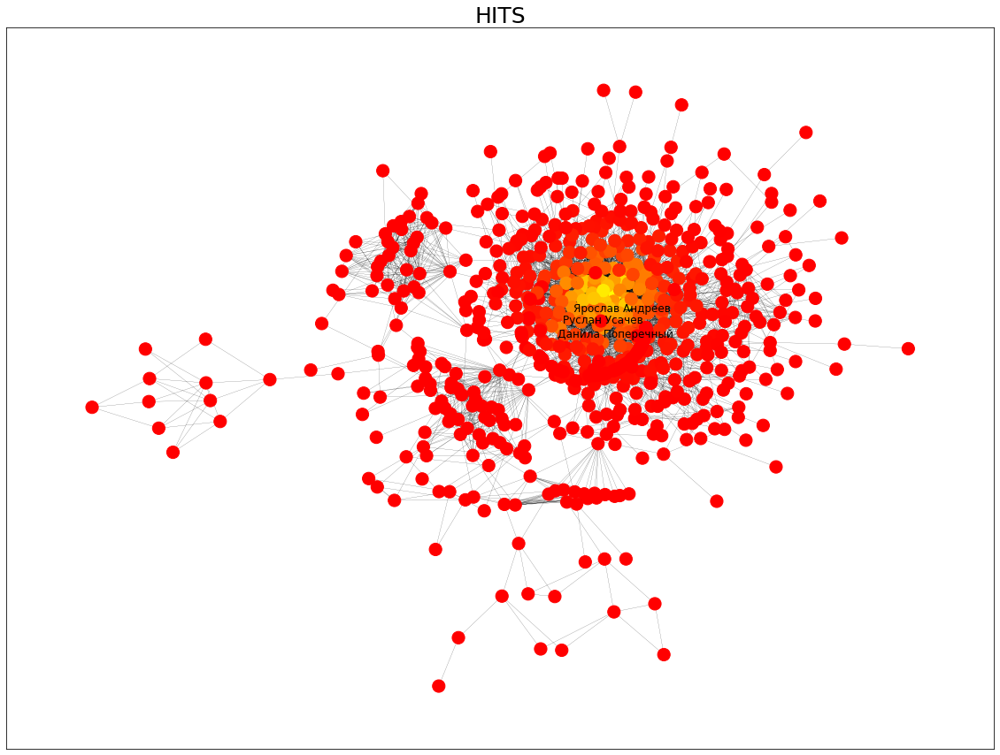

In [ ]:
layout = nx.kamada_kawai_layout(G)
hub_sorted_list = [hub_sorted[node] for node in G.nodes]
h = hub_df.head(3)
ids = h["ID"].values
names = h["Name"].values
labels = {ids[i]:names[i] for i in range(len(ids))}

plt.figure(figsize=(20,15))
plt.title("HITS", fontsize = 25)
nx.draw_networkx(G, node_size=200, node_color=hub_sorted_list, width=0.15, pos=layout, cmap='autumn', with_labels=False)
for key in labels.keys():
  layout[key][1] -= 0.0007 * G.degree[key]
nx.draw_networkx_labels(G, labels=labels, pos=layout)
plt.show()

* <h1>Correlation comparison of centralities.</h1>

In [ ]:
def pearson_correlation(i_vals: np.array, j_vals: np.array) -> float:
    """
    Calculate Pearson correlation coefficient
    :param i_vals: array of centralities
    :param j_vals: array of centralities
    :return: Pearson's correlation
    """
    return np.corrcoef(np.array(i_vals).T, np.array(j_vals))[0][1]

In [ ]:
centvals = [
    ('Degree', np.array(sorted(dc.items()))[:, 1].astype(float)),
    ('Closeness', np.array(sorted(cc.items()))[:, 1].astype(float)),
    ('Betweenness', np.array(sorted(bc.items()))[:, 1].astype(float)),
    ('Katz', np.array(sorted(kc.items()))[:, 1].astype(float)), 
    ('Eigenvector', np.array(sorted(ec.items()))[:, 1].astype(float))
]

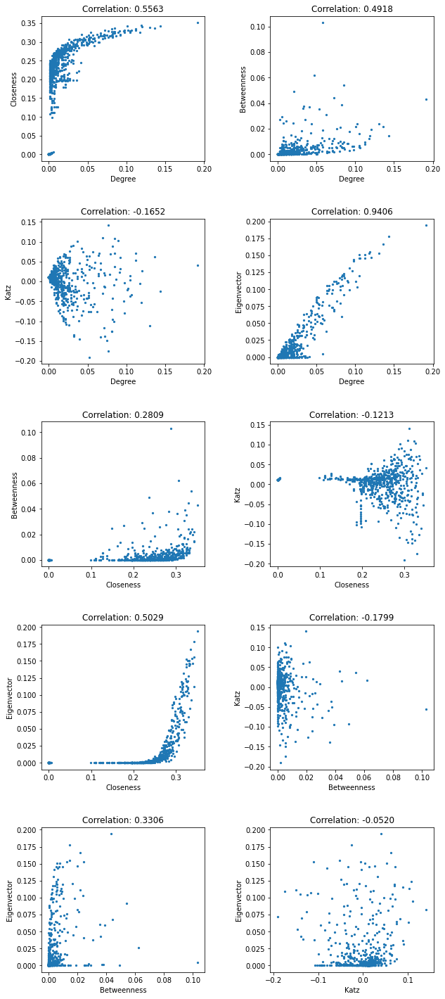

In [ ]:
plt.figure(figsize=(2*5, 5*5))
plt.subplots_adjust(hspace=0.4, wspace=0.4)
k = 1

for i in range(len(centvals)):
    for j in range(i + 1, len(centvals)):
        i_label, i_vals = centvals[i]
        j_label, j_vals = centvals[j]
        correlation = pearson_correlation(i_vals, j_vals)
        plt.subplot(5, 2, k)
        plt.scatter(i_vals, j_vals, s=5)
        plt.title('Correlation: {:.4f}'.format(correlation))
        plt.xlabel(i_label)
        plt.ylabel(j_label)
        k += 1

<h1>Связь DC и EigVec centrality очевидна: чем более известный человек, тем больше у него соц. связей и друзей. Достаточно высокая корреляция у CC и DC, что объясняется родом деятельности владельца страницы: логично, что большая часть друзей тесно связана одним родом деятельности и тесно взаимодействуют. Стоит отметить отсутствие связи EigVec и Katz Centrality, что объясняется плохой репрезентативностью EigVec на графах из реального мира.</h1>

* <h1>Assortative mixing by node attributes and node degree.</h1>

In [ ]:
def assortiative_mixing_visualization(feature, G):
  dict_graph = nx.get_node_attributes(G, feature)
  keys = list(nx.get_node_attributes(G, feature).keys())
  values = list(set(nx.get_node_attributes(G, feature).values()))
  mapping = dict.fromkeys(values)
  for key in keys:
      if mapping[dict_graph[key]] is None:
          mapping[dict_graph[key]] = [key]
      else:
          mapping[dict_graph[key]].append(key)
  mixing = nx.attribute_mixing_matrix(G, feature)
  fig = px.imshow(mixing, 
                x=[m for m in mapping], 
                y=[m for m in mapping],
                text_auto=True, aspect="auto"
                )
  fig.update_layout(
      title="Assortiativity mixing: "+ feature[0].upper() + feature[1: ],
      title_x=0.5,
      font_family='Times New Roman'
  )
  fig.show()

<h1>Низкий показатель AM по степеням объянсяется наличием хабов внутри сети (разных известных персонажей), поведение внутри этих хабов может значительно разниться.</h1>

In [ ]:
assortiative_mixing_visualization("city", largest_connected_component)

<h1>Наибольшие показатели в МСК и СПБ, что объясняется большей социальной активностью людей в больших городах и большей схожестью.</h1>

<h1>По статистике, большая часть аудитории - мужская, что отображено на графике.</h1>

In [ ]:
display(HTML('<h1>Assortiativity Coefficient</h1>'))
pd.DataFrame(
    {
        'Degree': nx.degree_assortativity_coefficient(G),
        'City': nx.attribute_assortativity_coefficient(G, 'city'),
        'Education': nx.attribute_assortativity_coefficient(G, 'education'),
        'Sex': [nx.attribute_assortativity_coefficient(G, 'sex')]
    }
)

,Degree,City,Education,Sex
0,0.241123,0.077902,0.008181,0.111877


* <h1>Node structural equivalence/similarity.</h1>

In [ ]:
def sim_values(A, i, j):
    pval = np.corrcoef(A[i], A[j])[0, 1]
    jval = (A[i] * A[j]).sum() / ((A[i] + A[j]) != 0).sum()
    cval = A[i].T @ A[j] / np.linalg.norm(A[i]) / np.linalg.norm(A[j])
    return pval, jval, cval

In [ ]:
A = nx.to_numpy_array(G)
cos_sim = np.zeros(A.shape)
pearson_sim = np.zeros(A.shape)
jaccard_sim = np.zeros(A.shape)
for i in range(len(G)):
    for j in range(i, (len(G))):
        pval, jval, cval = sim_values(A, i, j)
        pearson_sim[i, j] = pval
        pearson_sim[j, i] = pval
        jaccard_sim[i, j] = jval
        jaccard_sim[j, i] = jval
        cos_sim[i, j] = cval
        cos_sim[j, i] = cval

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning:

invalid value encountered in true_divide

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning:

invalid value encountered in true_divide

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning:

invalid value encountered in double_scalars

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning:

invalid value encountered in double_scalars



In [ ]:
def plot_similarity(G, vect, name):
  fig = px.imshow(vect, 
                x=[G.nodes[id]['name'] for id in G.nodes],
                y=[G.nodes[id]['name'] for id in G.nodes],
                text_auto=True, 
                aspect="auto")
  fig.update_layout(
        title=name,
        title_x=0.5,
        font_family='Times New Roman'
    )
  fig.show()

In [ ]:
plot_similarity(G, cos_sim, "Cosine similarity")

<h1>Алгоритм Катхилла - МакКи</h1>

In [ ]:
def cm_order(G):
    return scipy.sparse.csgraph.reverse_cuthill_mckee(
        csr_matrix(nx.to_numpy_matrix(G))
        )

In [ ]:
order = cm_order(G)

In [ ]:
fig = px.imshow(pearson_sim[np.ix_(order, order)]) 
fig.update_layout(
        title='Корреляция Пирсона',
        title_x=0.5,
        font_family='Times New Roman'
    )
fig.show()

#<h1>Community Detection

- Clique search, k-cores visualization.
- Best results of various community detection algorithms, both in terms of interpretation and some quality criterion (modularity, silhouette, ground truth partition).
- The results should be visible on the network layout.</h1>

<h1>Clique search</h1>

In [ ]:
display(HTML('<h1>Number of cliques: %a<h1/>'%nx.graph_number_of_cliques(G)))

In [ ]:
def largest_cliques(G):
    cliques =  list(nx.find_cliques(G))
    length = 0
    n = 0
    for clique in cliques:
        if len(clique)==length:
            n += 1
        if len(clique)>length:
            length = len(clique)
            n = 0
            n += 1
    m = nx.number_of_nodes(G)
    k = nx.number_of_edges(G)
    colors = np.ones((n, m, 3))
    width = np.ones((n,k))
    i = 0
    for clique in cliques:
        if len(clique)==length:
            for j,node in enumerate(G.nodes):
                if node in clique:
                    colors[i,j] = [0.5,0.5, 0.9]
            for l,edge in enumerate(G.edges):
                if edge[0] in clique and edge [1] in clique:
                    width[i,l] = 2
            i+=1
    display(HTML('<h1>Максимальный размер клики: %a</h1>'% length))
    display(HTML('<h1>Количество клик максимального размера: %a</h1>'% len(width)))
    return colors, width

In [ ]:
colors, widths = largest_cliques(G)
size = np.unique(colors[0], axis=0, return_counts=True)[1][0]

(-1.1731913093407451,
 0.8226323506811761,
 -1.0275983880988777,
 0.7291802938139095)

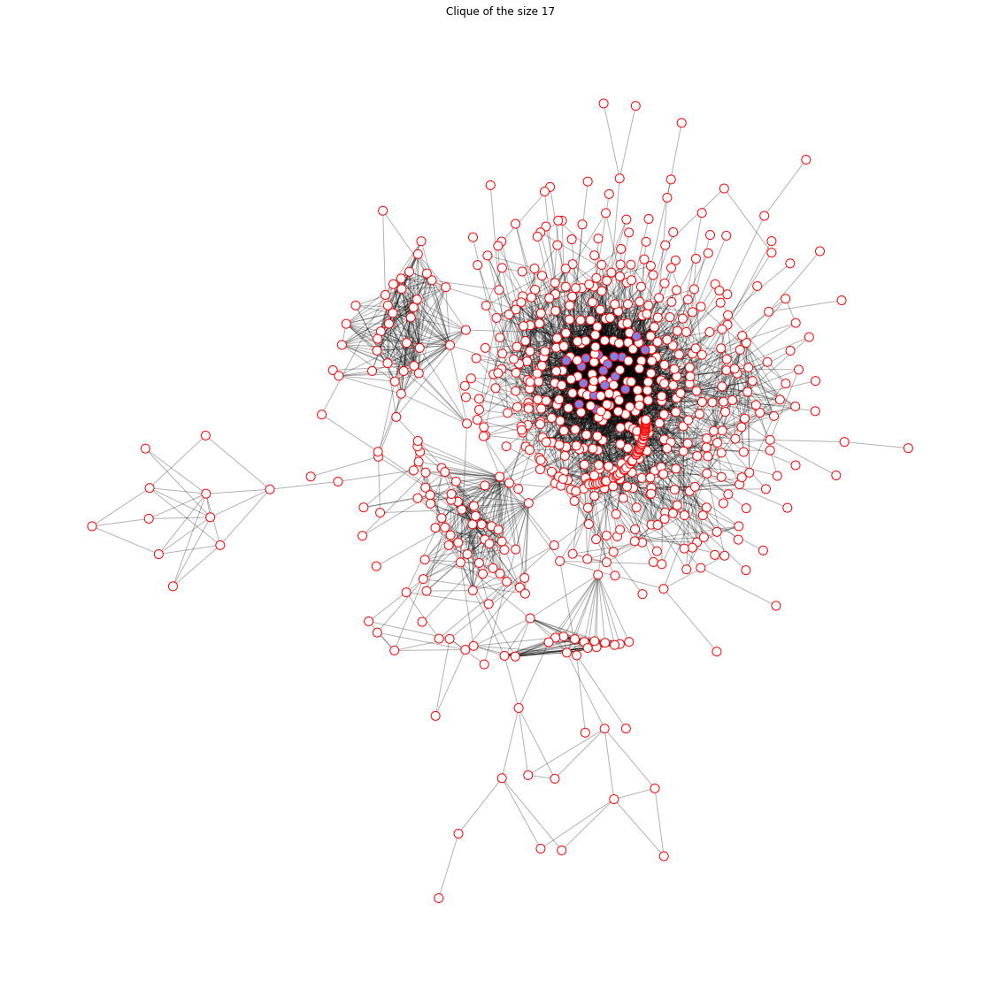

In [ ]:
plt.figure(figsize=(20, 20))
layout = nx.kamada_kawai_layout(G)

b_edges = np.array(list(G.edges))[widths[0] == widths[0].max()]

nodes = nx.draw_networkx_nodes(
        G, 
        layout,
        node_color=colors[0], 
        node_size=100, 
        linewidths=1, 
        edgecolors='red'
)
nx.draw_networkx_edges(
        G,
        layout,
        alpha=0.3,
        width=widths[0].min()
)
nx.draw_networkx_edges(
        G,
        layout,
        width=widths[0].max(),
        edgelist=b_edges
)
plt.title('Clique of the size {}'.format(size))
plt.axis('off')
plt.show()

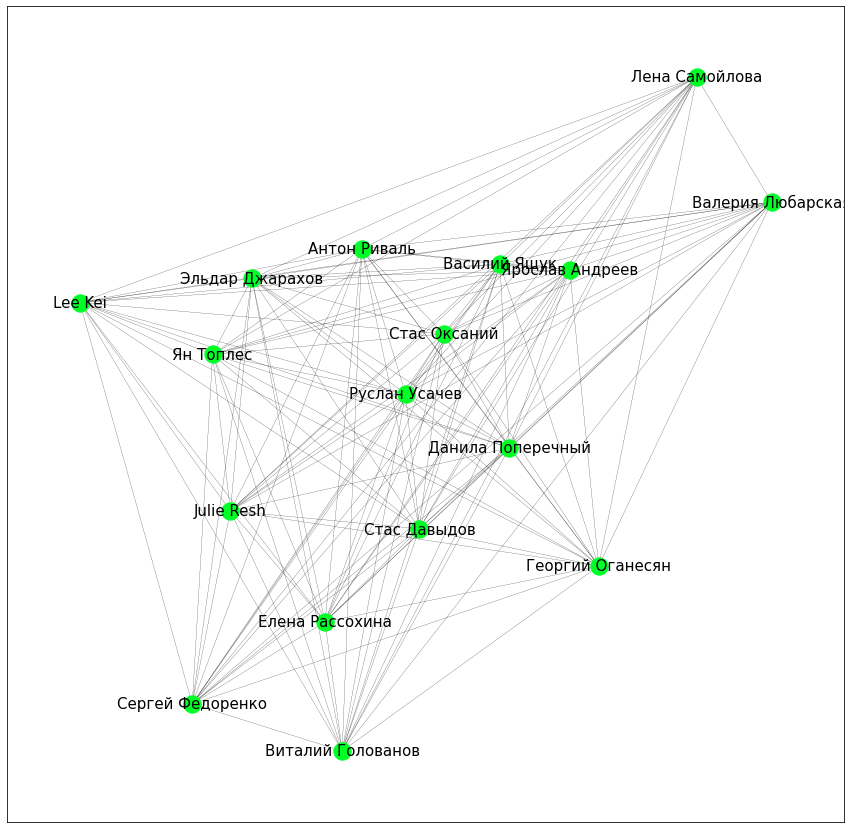

In [ ]:
plt.figure(figsize=(15,15))
maximum_clique_subgraph = G.subgraph(sorted(list(nx.find_cliques(G)), key = len, reverse=True)[0])
nx.draw_networkx(maximum_clique_subgraph,
                     nx.kamada_kawai_layout(G),
                     node_color = '#00ff26',
                     labels = {id_: nx.get_node_attributes(G, 'name')[id_] for id_ in maximum_clique_subgraph.nodes},
                     font_size = 15,
                     width = 0.2)

<h1>k-cores visualization</h1>

In [ ]:
kcore = nx.core_number(largest_connected_component)
attr_dict = {
    id: {"k-core": value} for id, value in nx.core_number(largest_connected_component).items()
    }
nx.set_node_attributes(G, attr_dict)
kcore_values = np.array(list(kcore.values()))
shell_dict = {}
for kcore_value in np.unique(kcore_values):
    num = 0
    for k in kcore_values:
        if kcore_value == k:
            num += 1
    shell_dict[kcore_value] = [round(num/len(kcore_values)*100, 3)]

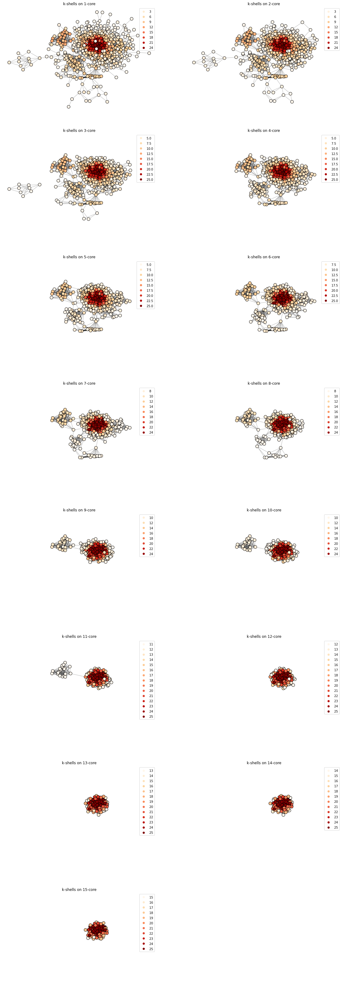

In [ ]:
plt.figure(figsize=(20, 60))

x_max, y_max = np.array(list(layout.values())).max(axis=0)
x_min, y_min = np.array(list(layout.values())).min(axis=0)

for i in range(15):
    plt.subplot(8, 2, i+1)
    subG = nx.k_core(G, i+1)
    kcore_colors = np.array(list(nx.core_number(subG).values()))
    nodes = nx.draw_networkx_nodes(
        subG, 
        layout,
        node_color = kcore_colors,
        cmap=plt.cm.OrRd,
        node_size=100, 
        edgecolors='black'
    )
    nx.draw_networkx_edges(
        subG, 
        layout,
        alpha=0.3,
        width=1, 
        edge_color='black'
    )
    eps = (x_max - x_min) * 0.05
    plt.xlim(x_min-eps, x_max+eps)
    plt.ylim(y_min-eps, y_max+eps)
    plt.legend(*nodes.legend_elements())
    plt.axis('off')
    plt.title('k-shells on {}-core'.format(i+1))

* <h1>Best results of various community detection algorithms, both in terms of interpretation and some quality criterion (modularity, silhouette, ground truth partition)</h1>

<h1>Girvan-Newman algorithm</h1>

In [ ]:
# Функции для реализации
# алгоритма Гирвана - Ньюмана.
def remove_bridges(G):
    n_cc = nx.number_connected_components(G)
    while nx.number_connected_components(G) == n_cc:
        ebetweenness = nx.edge_betweenness_centrality(G)
        max_edge = max(ebetweenness, key=ebetweenness.get)
        G.remove_edge(*max_edge)


def girvan_newman(G, n):
    labels = np.zeros((n, len(G)))
    _G = G.copy()
    for division in range(n):
        remove_bridges(_G)
        for i, cc in enumerate(nx.connected_components(_G)):
            labels[division, list(cc)] = i
    return labels

In [ ]:
gn_comm = list(nx.algorithms.community.girvan_newman(largest_connected_component))
dist = np.zeros((
                 nx.number_of_nodes(largest_connected_component), 
                 nx.number_of_nodes(largest_connected_component))
)
nodes_lcc = list(largest_connected_component.nodes)
for i in range(nx.number_of_nodes(largest_connected_component)):
    for j in range(i+1, nx.number_of_nodes(largest_connected_component)):
        dist[i,j] = nx.shortest_path_length(G, nodes_lcc[i], nodes_lcc[j])
        dist[j,i] = dist[i,j]

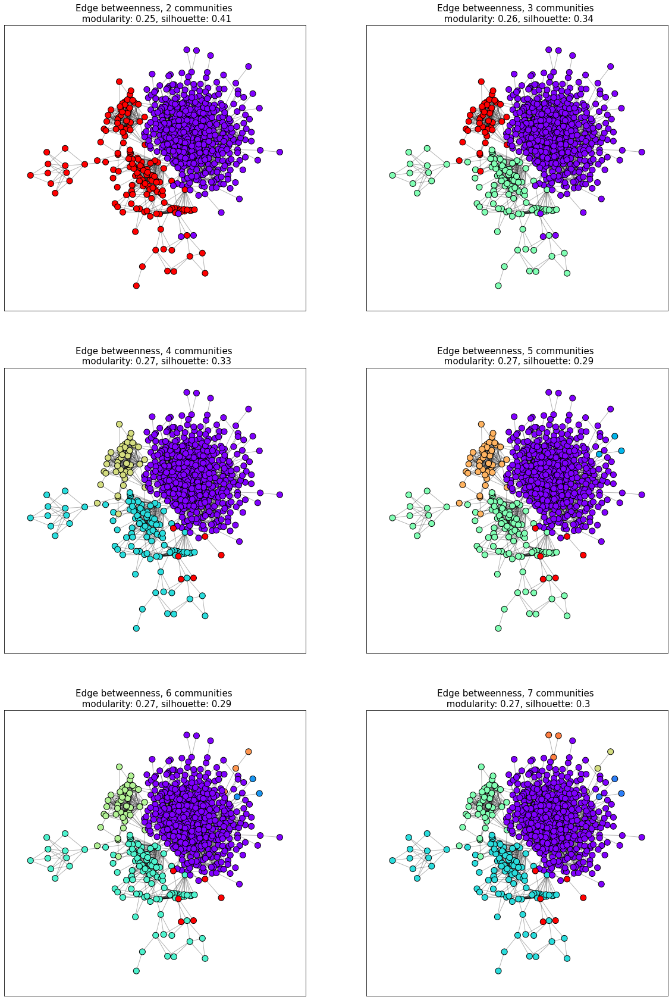

In [ ]:
plt.figure(figsize=(20,30))
for i in range(6):
    plt.subplot(3, 2, i+1)
    kcore_colors = []
    for node in largest_connected_component.nodes:
        for j, c_ in enumerate(gn_comm[i]):
            if node in c_:
                kcore_colors.append(j+1)
    kcore_colors = np.array(kcore_colors)
    nodes = nx.draw_networkx_nodes(
        largest_connected_component, 
        layout,
        node_color = kcore_colors,
        cmap='rainbow',
        node_size=100, 
        edgecolors='black'
    )
    nx.draw_networkx_edges(
        largest_connected_component, 
        layout,
        alpha=0.3,
        width=1, 
        edge_color='black'
    )
    mod = round(modularity(largest_connected_component, gn_comm[i]),2)
    sil = round(silhouette_score(dist, kcore_colors),2)
    plt.title('Edge betweenness, {} communities \n modularity: {}, silhouette: {}'.format(len(gn_comm[i]),
              mod, sil), fontsize = 15)

<h1>Spectral clustering</h1>

In [ ]:
# Функции для реализации 
# спектральной кластеризации.

def norm_laplacian(A):
    G = nx.Graph(A)
    degrees = list(G.degree())
    D = np.array(degrees)[:,1]
    L = np.diag(D**(-1/2))@(np.diag(D) - A)@np.diag(D**(-1/2))
    return L, D

def spectral_embedding(L, degree_seq, n_components):
    vals, vecs = np.linalg.eigh(L)
    return (vecs*degree_seq.reshape((-1,1))**(-1/2))[:, 1:n_components+1]

def spectral_clustering(G, n_clusters, n_components):
    A = nx.to_numpy_array(G)
    L, degree_seq = norm_laplacian(A)
    embedding = spectral_embedding(L, degree_seq, n_components)
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(embedding)
    return kmeans.labels_

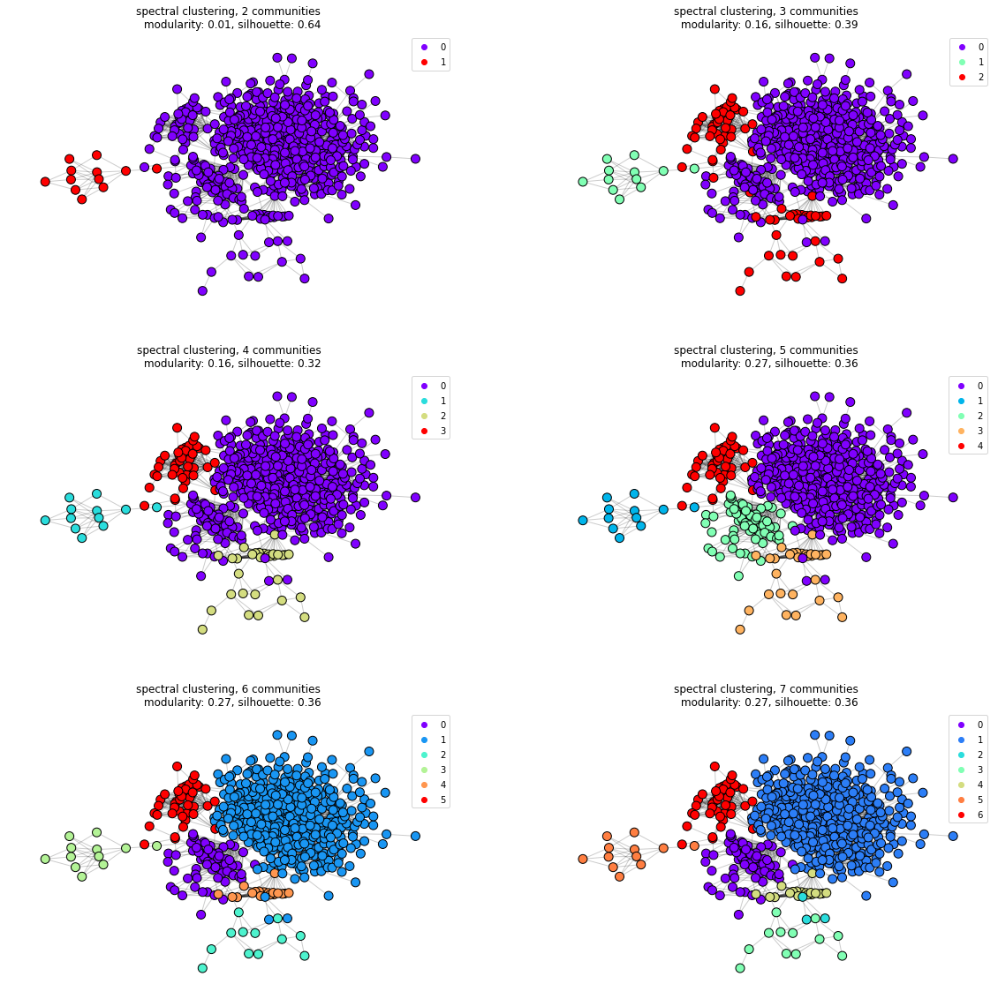

In [ ]:
A = nx.to_numpy_array(largest_connected_component)
L, degree_seq = norm_laplacian(A)

plt.figure(figsize=(20, 20))
for i in range(2,8):
    plt.subplot(3,2,i-1)
    embedding = spectral_embedding(L, degree_seq, i-1)
    embedding = spectral_embedding(L, degree_seq, i-1)
    labels = spectral_clustering(largest_connected_component, i, i-1)
    
    comm = []
    for l in np.unique(labels):
        c = set()
        for i, label in enumerate(labels):
            if label==l:
                c.add(list(largest_connected_component.nodes)[i])
        comm.append(c)

    nodes = nx.draw_networkx_nodes(
        largest_connected_component, 
        layout,
        cmap='rainbow',
        node_color=labels, 
        node_size=100, 
        linewidths=1, 
        edgecolors='black'
    )
    nx.draw_networkx_edges(
        largest_connected_component,
        layout,
        alpha=0.2,
        edge_color='black'
    )
    plt.axis('off')
    plt.legend(*nodes.legend_elements())
    
    mod = round(modularity(largest_connected_component, comm),2)
    sil = round(silhouette_score(dist, labels),2)
    plt.title('spectral clustering, {} communities \n modularity: {}, silhouette: {}'.format(len(comm), mod, sil))

<h1>Agglomerative clustering</h1>

In [ ]:
# Функции для визуализации
# агломеративной кластеризации
def simrank_distance(G):
    sim = nx.simrank_similarity_numpy(G)
    for i in range(sim.shape[0]):
        for j in range(i):
            sim[j,i] = sim[i,j]
    return 1 - sim

def agglomerative_clustering(distance, max_distance):
    return AgglomerativeClustering(
        n_clusters = None, 
        affinity='precomputed', 
        linkage='complete', 
        distance_threshold=max_distance
        ).fit_predict(distance)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning:

networkx.simrank_similarity_numpy is deprecated and will be removedin NetworkX 3.0, use networkx.simrank_similarity instead.



Text(0.5, 1.0, 'Agglomerative clustering, 34 communities \n modularity: 0.39, silhouette: 0.06')

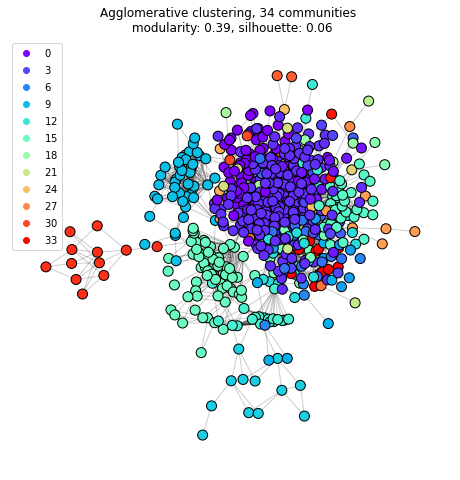

In [ ]:
distance = simrank_distance(largest_connected_component)
labels = agglomerative_clustering(distance, 0.97)
comm = []
for l in np.unique(labels):
    c = set()
    for i, label in enumerate(labels):
        if label==l:
            c.add(list(largest_connected_component.nodes)[i])
    comm.append(c)
    
plt.figure(figsize=(8, 8))
nodes = nx.draw_networkx_nodes(
    largest_connected_component, 
    layout,
    cmap=plt.cm.rainbow,
    node_color=labels, 
    node_size=100, 
    linewidths=1, 
    edgecolors='black'
)
nx.draw_networkx_edges(
    largest_connected_component,
    layout,
    alpha=0.2,
    edge_color='black'
)
plt.axis('off')
plt.legend(*nodes.legend_elements())
mod = round(modularity(largest_connected_component, comm),2)
sil = round(silhouette_score(dist, labels),2)
plt.title('Agglomerative clustering, {} communities \n modularity: {}, silhouette: {}'.format(len(comm), mod, sil))

<h1>Лучшие результаты демонстрирует алгоритм спектральной кластеризации, что объяснимо, так как в данном алгоритме данные рассматриваются как узлы в графах, после чего узлы ставятся в соответствие с пространством малой размерности, которые, в свою очередь, интерпретируются как кластеры.<br><br>Лучшие результаты по метрикам Silhoutte и Modularity показал алгоритм спектральной кластеризации с 5-ю комьюнити, которые условно можно разделить на три большие группы:<br>1) "Коллеги" по производству<br>2) Люди, занимающиеся съемками (операторы, режиссеры, фотографы и т.п.)<br>3) Возможные друзья из прошлого</h1>

